# Introduction

* This project analyze data, use data augmentation, and build suitable deep learning models that can recognize 6 categories of natural images (**buildings**, **forest**, **glacier**, **mountain**, **sea**, and **street**).
* the dataset contains natural images of size 150x150 for 6 categories. The training set contains 6 folders, around 2300 for each category. The testing set contains 3050 images.


    buildings = 0
    forest = 1
    glacier = 2
    mountains = 3
    sea = 4
    street = 5


# Import Frameworks and Packages

In [1]:
import numpy as np                         # Handle Numerical Data (Store, load, oprations)
import pandas as pd                        # convert datasheets to data frames
import matplotlib.pyplot as plt            # used to (draw/plot) the data for visual representations
from matplotlib import image as mpimg      # to show images
import os                                  # used with directories (remove/create folders - fetch content - change and identifing dirctories)
import tensorflow as tf

# Get Data From **Kaggle**

In [2]:
!pip install -q kaggle # install kaggle libery

In [3]:
! mkdir ~/.kaggle  # new directory to save kagle data

In [4]:
! cp kaggle.json ~/.kaggle/  

In [5]:
! chmod 600 ~/.kaggle/kaggle.json # change premission 

In [6]:
! kaggle competitions download -c sprints-ai-and-ml-competition-2022   #get data

 96% 234M/244M [00:06<00:00, 42.6MB/s]
100% 244M/244M [00:06<00:00, 39.1MB/s]


In [7]:
! unzip sprints-ai-and-ml-competition-2022  # unzip foldeer

Streaming output truncated to the last 5000 lines.
  inflating: Scenes training set/Scenes training set/mountain/7539.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7551.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7560.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7565.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7578.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7581.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7586.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7647.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7652.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7654.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7662.jpg  
  inflating: Scenes training set/Scenes training set/mountain/767.jpg  
  inflating: Scenes training set/Scenes training set/mountain/7672.jpg  
 

# Prepare Data


In [8]:
path_folder_training = 'Scenes training set/Scenes training set'             # training folder path that contain all folders of images 

categories = os.listdir(path_folder_training)                                # list of all categories

categories_indecies_decode = ['buildings','forest','glacier','mountain','sea','street']

In [9]:
training_ds=tf.keras.utils.image_dataset_from_directory(path_folder_training,image_size=(150, 150),validation_split=.1,subset='training',seed=1)
val_ds=tf.keras.utils.image_dataset_from_directory(path_folder_training,image_size=(150, 150),validation_split=.1,subset='validation',seed=1)

# image_size => to make sure or resize all images with the same dimansions (150*150)
# validation_split => takes values between [0,1] and its the percentage of validation data from the main data
# subset => takes values 'training' or 'validation' and indecates weather it will return the training data or validation one
# seed => as random state in ml (to make sure it gives the same values each time the code runs)

Found 14034 files belonging to 6 classes.
Using 12631 files for training.
Found 14034 files belonging to 6 classes.
Using 1403 files for validation.


In [10]:
test_ds =tf.keras.utils.image_dataset_from_directory('Scenes testing test/',image_size=(150,150))

Found 3050 files belonging to 1 classes.


# Visualization

## Training Data

1) Buildings

In [ ]:
len(os.listdir(path_folder_training+"/buildings"))

2191

**Observation:**
* There are 2191 images for buildings

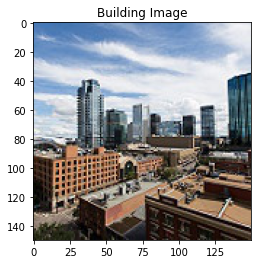

In [ ]:
plt.title("Building Image")
image = mpimg.imread(path_folder_training+"/buildings/10006.jpg")
plt.imshow(image)
plt.show()

2) Forests

In [ ]:
len(os.listdir(path_folder_training+"/forest"))

2271

**Observation:**
* There are 2271 images for forests

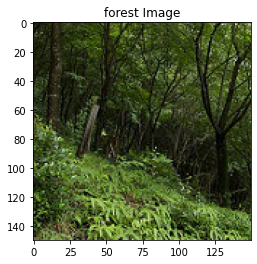

In [ ]:
plt.title("forest Image")
image = mpimg.imread(path_folder_training+"/forest/10007.jpg")
plt.imshow(image)
plt.show()

3) Streets

In [ ]:
len(os.listdir(path_folder_training+"/street"))

2382

**Observation:**
* There are 2382 images for streets

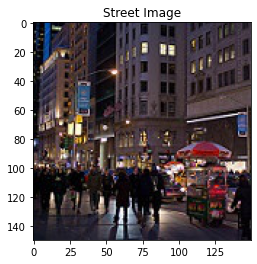

In [ ]:
plt.title("Street Image")
image = mpimg.imread(path_folder_training+"/street/1005.jpg")
plt.imshow(image)
plt.show()

4) Sea

In [ ]:
len(os.listdir(path_folder_training+"/sea"))

2274

**Observation:**
* There are 2274 images for sea

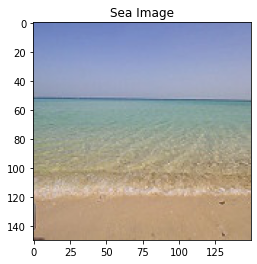

In [ ]:
plt.title("Sea Image")
image = mpimg.imread(path_folder_training+"/sea/10016.jpg")
plt.imshow(image)
plt.show()

5) Mountain

In [ ]:
len(os.listdir(path_folder_training+"/mountain"))

2512

**Observation:**
* There are 2512 images for mountains

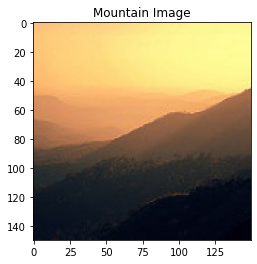

In [ ]:
plt.title("Mountain Image")
image = mpimg.imread(path_folder_training+"/mountain/10000.jpg")
plt.imshow(image)
plt.show()

6) Glacier

In [ ]:
len(os.listdir(path_folder_training+"/glacier"))

2404

**Observation:**
* There are 2404 images for glacier

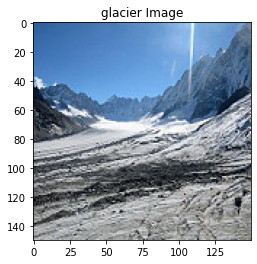

In [ ]:
plt.title("glacier Image")
image = mpimg.imread(path_folder_training+"/glacier/10.jpg")
plt.imshow(image)
plt.show()

**Conclusion:**
* The data set is not up or down sampled or baised to a certain class

## Training Data after converting to tensor

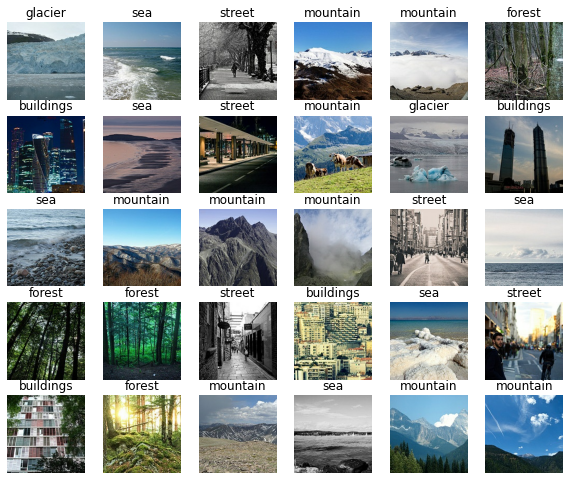

In [ ]:
plt.figure(figsize=(10, 10))

class_names = training_ds.class_names

for images, labels in training_ds.take(1):
    for i in range(30):
        ax = plt.subplot(6, 6, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

## Validation Data after converting to tensor

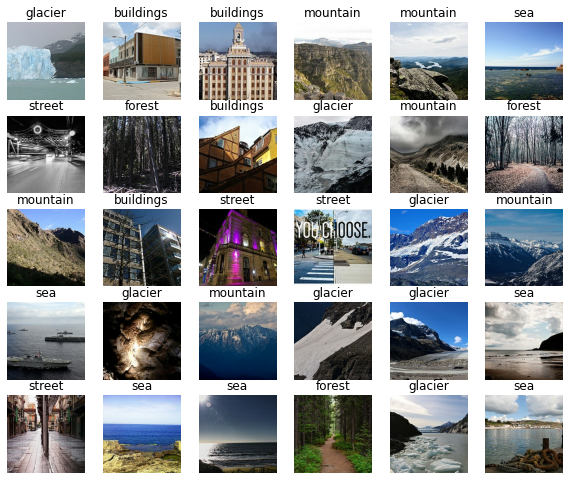

In [ ]:
plt.figure(figsize=(10, 10))

class_names = val_ds.class_names

for images, labels in val_ds.take(1):
    for i in range(30):
        ax = plt.subplot(6, 6, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

## Testing Data ( Used For Prediction )

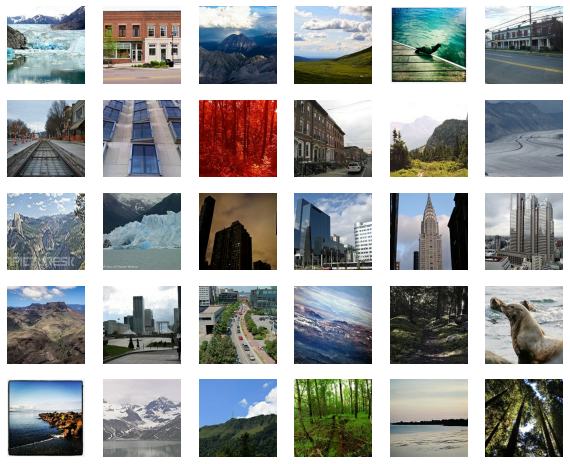

In [ ]:
plt.figure(figsize=(10, 10))

class_names = test_ds.class_names

for images, labels in test_ds.take(1):
    for i in range(30):
        ax = plt.subplot(6, 6, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")

# Model

## Model without Data augmentation

In [11]:
# build model
model1 = tf.keras.Sequential()

# # Normalization layer
model1.add(tf.keras.layers.Rescaling(scale=1./255,input_shape=( 150, 150, 3)))

# 1st Filter layer
model1.add(tf.keras.layers.Conv2D(16,3, padding='same',activation='relu',input_shape=(150, 150, 3)))

# 1st Pool layer
model1.add(tf.keras.layers.MaxPool2D())

# 2nd Filter layer
model1.add(tf.keras.layers.Conv2D(32,3, padding='same',activation='relu'))

# 2nd Pool layer
model1.add(tf.keras.layers.MaxPool2D())

# 3rd Filter layer
model1.add(tf.keras.layers.Conv2D(64,3, padding='same',activation='relu',input_shape=(150, 150, 3)))

# 3rd Pool layer
model1.add(tf.keras.layers.MaxPool2D())

# Flatten Layer
model1.add(tf.keras.layers.Flatten())

# Dropout layer
model1.add(tf.keras.layers.Dropout(.25))

# Hidden layers
model1.add(tf.keras.layers.Dense(128,activation='relu'))

model1.add(tf.keras.layers.Dense(6))

model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 150, 150, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 150, 150, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 75, 75, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 37, 37, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 37, 37, 64)        1

In [ ]:
# optimizer
model1.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics='accuracy')

In [ ]:
history1 = model1.fit(training_ds,epochs=50,validation_data=val_ds)

Epoch 1/50
395/395 [==============================] - 23s 28ms/step - loss: 0.9745 - accuracy: 0.6243 - val_loss: 0.8776 - val_accuracy: 0.6657
Epoch 2/50
395/395 [==============================] - 11s 27ms/step - loss: 0.6344 - accuracy: 0.7665 - val_loss: 0.6267 - val_accuracy: 0.7762
Epoch 3/50
395/395 [==============================] - 11s 27ms/step - loss: 0.4809 - accuracy: 0.8279 - val_loss: 0.6035 - val_accuracy: 0.7840
Epoch 4/50
395/395 [==============================] - 11s 27ms/step - loss: 0.3390 - accuracy: 0.8769 - val_loss: 0.7637 - val_accuracy: 0.7662
Epoch 5/50
395/395 [==============================] - 11s 27ms/step - loss: 0.2433 - accuracy: 0.9161 - val_loss: 0.6902 - val_accuracy: 0.8083
Epoch 6/50
395/395 [==============================] - 11s 27ms/step - loss: 0.1826 - accuracy: 0.9355 - val_loss: 0.7939 - val_accuracy: 0.7826
Epoch 7/50
395/395 [==============================] - 11s 27ms/step - loss: 0.1419 - accuracy: 0.9515 - val_loss: 1.0335 - val_accuracy:

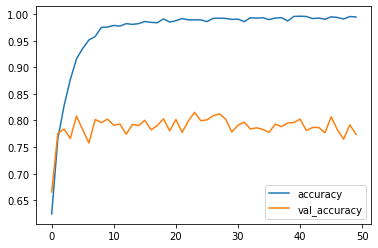

In [ ]:
plt.plot(history1.history['accuracy'],label='accuracy')
plt.plot(history1.history['val_accuracy'],label='val_accuracy')
plt.legend()

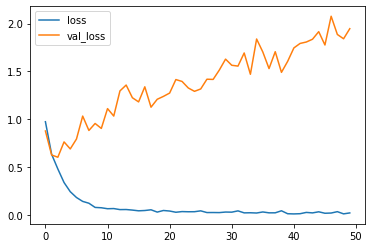

In [ ]:
plt.plot(history1.history['loss'],label='loss')
plt.plot(history1.history['val_loss'],label='val_loss')
plt.legend()

**Observation:**
* The model is over fitting
* the data will need augmentation

## Model with data augmentation

In [12]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal',input_shape=(150,150,3)),
    tf.keras.layers.RandomZoom( 0.25 ),
    tf.keras.layers.RandomRotation(0.25)
])

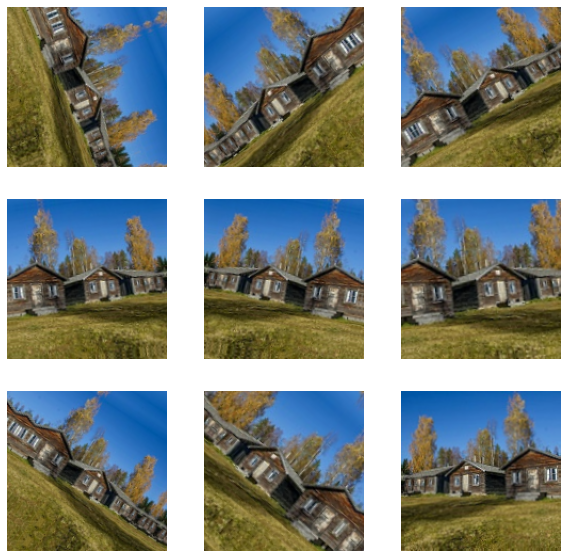

In [ ]:
# Show a few augmented examples applied to the same image several times

plt.figure(figsize=(10, 10))
for images, _ in training_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis('off')


In [13]:
# build model
model2 = tf.keras.Sequential()

# add data augmntation
model2.add(data_augmentation)

# # Normalization layer
model2.add(tf.keras.layers.Rescaling(scale=1./255,input_shape=( 150, 150, 3)))

# 1st Filter layer
model2.add(tf.keras.layers.Conv2D(16,3, padding='same',activation='relu',input_shape=(150, 150, 3)))

# 1st Pool layer
model2.add(tf.keras.layers.MaxPool2D())

# 2nd Filter layer
model2.add(tf.keras.layers.Conv2D(32,3, padding='same',activation='relu'))

# 2nd Pool layer
model2.add(tf.keras.layers.MaxPool2D())

# 3rd Filter layer
model2.add(tf.keras.layers.Conv2D(64,3, padding='same',activation='relu',input_shape=(150, 150, 3)))

# 3rd Pool layer
model2.add(tf.keras.layers.MaxPool2D())

# Flatten Layer
model2.add(tf.keras.layers.Flatten())

# Dropout layer
model2.add(tf.keras.layers.Dropout(.25))

# Hidden layers
model2.add(tf.keras.layers.Dense(128,activation='relu'))

model2.add(tf.keras.layers.Dense(6))

model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 150, 150, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 150, 150, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 150, 150, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 75, 75, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 75, 75, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 37, 37, 32)       0         
 2D)                                                  

In [14]:
# optimizer
model2.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics='accuracy')

In [15]:
history2 = model2.fit(training_ds,epochs=50,validation_data=val_ds)

Epoch 1/50
395/395 [==============================] - 25s 29ms/step - loss: 1.1951 - accuracy: 0.5301 - val_loss: 1.2802 - val_accuracy: 0.5082
Epoch 2/50
395/395 [==============================] - 11s 27ms/step - loss: 1.0119 - accuracy: 0.6193 - val_loss: 1.0220 - val_accuracy: 0.6087
Epoch 3/50
395/395 [==============================] - 12s 29ms/step - loss: 0.9271 - accuracy: 0.6509 - val_loss: 0.9129 - val_accuracy: 0.6543
Epoch 4/50
395/395 [==============================] - 11s 28ms/step - loss: 0.8600 - accuracy: 0.6828 - val_loss: 0.9891 - val_accuracy: 0.6265
Epoch 5/50
395/395 [==============================] - 11s 27ms/step - loss: 0.8285 - accuracy: 0.6957 - val_loss: 0.9771 - val_accuracy: 0.6379
Epoch 6/50
395/395 [==============================] - 12s 29ms/step - loss: 0.7870 - accuracy: 0.7118 - val_loss: 0.9059 - val_accuracy: 0.6736
Epoch 7/50
395/395 [==============================] - 11s 28ms/step - loss: 0.7637 - accuracy: 0.7190 - val_loss: 0.8104 - val_accuracy:

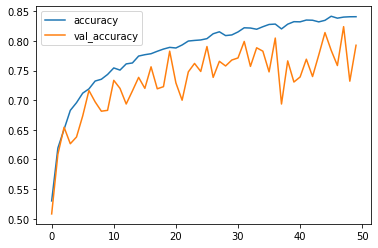

In [16]:
plt.plot(history2.history['accuracy'],label='accuracy')
plt.plot(history2.history['val_accuracy'],label='val_accuracy')
plt.legend()

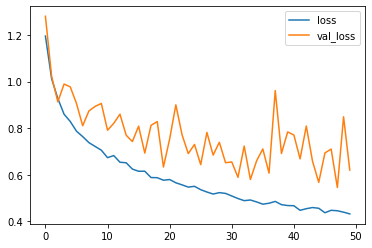

In [17]:
plt.plot(history2.history['loss'],label='loss')
plt.plot(history2.history['val_loss'],label='val_loss')
plt.legend()

**Observation:**
* model reached  accuracy: 0.807


## Get Predictions

In [18]:
# import the modules
from keras.models import load_model
from keras.preprocessing import image

# get the path/directory
test_folder = "Scenes testing test/Scenes testing test"

# load all images into a list
images = []
prediction2 = []

for img in os.listdir(test_folder):
  images.append(img)
  img = os.path.join(test_folder, img)
  img = image.load_img(img, target_size=(150, 150,3))
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  
  pred = model2.predict(img)
  prediction2.append(np.argmax(pred))

In [19]:
images[:9]

['22291.jpg',
 '21734.jpg',
 '21087.jpg',
 '23773.jpg',
 '21437.jpg',
 '21450.jpg',
 '23815.jpg',
 '24290.jpg',
 '21447.jpg']

In [20]:
prediction2[:9]

[5, 3, 1, 5, 2, 2, 0, 5, 0]

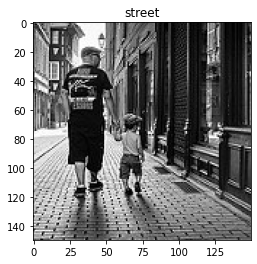

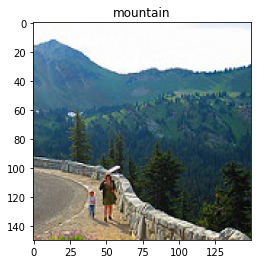

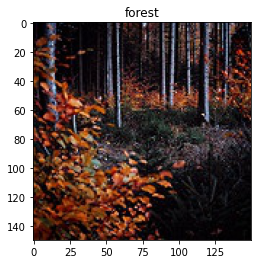

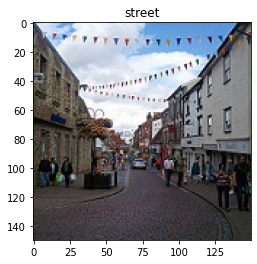

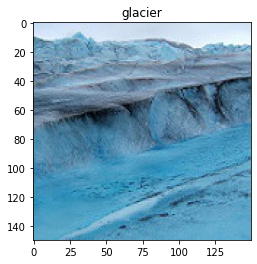

...

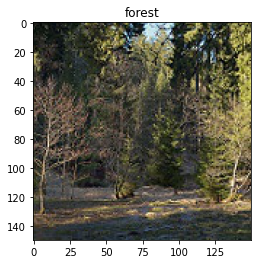

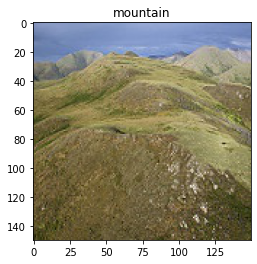

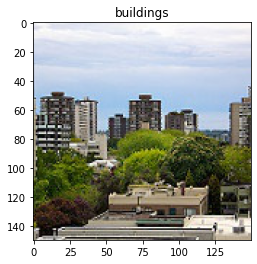

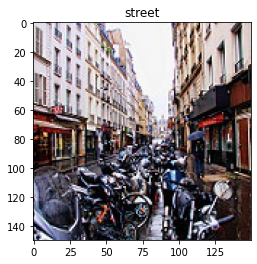

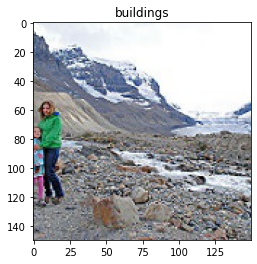

In [21]:
# Show a sample of predicted images
for i in range(20):
  plt.title(categories_indecies_decode[prediction2[i]])
  image = mpimg.imread(test_folder+'/'+images[i])
  plt.imshow(image)
  plt.show()

## Another Model with data augmentation

In [ ]:
# build model
model3=tf.keras.Sequential()

# add data augmntation
model3.add(data_augmentation)

# # Normalization layer
model3.add(tf.keras.layers.Rescaling(scale=1./255,input_shape=( 150, 150, 3)))

# 1st Filter layer
model3.add(tf.keras.layers.Conv2D(16,3, padding='same',activation='relu',input_shape=(150, 150, 3)))

# 1st Pool layer
model3.add(tf.keras.layers.MaxPool2D())

# 2nd Filter layer
model3.add(tf.keras.layers.Conv2D(32,3, padding='same',activation='relu'))

# 2nd Pool layer
model3.add(tf.keras.layers.MaxPool2D())

# 3rd Filter layer
model3.add(tf.keras.layers.Conv2D(64,3, padding='same',activation='relu'))

# 3rd Pool layer
model3.add(tf.keras.layers.MaxPool2D())

# 4th Filter layer
model3.add(tf.keras.layers.Conv2D(128,3, padding='same',activation='relu'))

# 4th Pool layer
model3.add(tf.keras.layers.MaxPool2D())

# Flatten Layer
model3.add(tf.keras.layers.Flatten())

# Dropout layer
model3.add(tf.keras.layers.Dropout(.25))

model3.add(tf.keras.layers.Dense(6))

model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 150, 150, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 150, 150, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 150, 150, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 75, 75, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 75, 75, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 37, 37, 32)       0         
 2D)                                                  

In [ ]:
# optimizer
model3.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics='accuracy')

In [ ]:
history3 = model3.fit(training_ds,epochs=50,validation_data=val_ds)

Epoch 1/50
395/395 [==============================] - 12s 28ms/step - loss: 1.2513 - accuracy: 0.5019 - val_loss: 1.0719 - val_accuracy: 0.5987
Epoch 2/50
395/395 [==============================] - 11s 28ms/step - loss: 1.0334 - accuracy: 0.6111 - val_loss: 0.9872 - val_accuracy: 0.6251
Epoch 3/50
395/395 [==============================] - 12s 29ms/step - loss: 0.9550 - accuracy: 0.6453 - val_loss: 0.9071 - val_accuracy: 0.6629
Epoch 4/50
395/395 [==============================] - 11s 28ms/step - loss: 0.9096 - accuracy: 0.6648 - val_loss: 1.1168 - val_accuracy: 0.6115
Epoch 5/50
395/395 [==============================] - 12s 29ms/step - loss: 0.8743 - accuracy: 0.6748 - val_loss: 1.1683 - val_accuracy: 0.6058
Epoch 6/50
395/395 [==============================] - 12s 29ms/step - loss: 0.8276 - accuracy: 0.6981 - val_loss: 0.8561 - val_accuracy: 0.6978
Epoch 7/50
395/395 [==============================] - 12s 31ms/step - loss: 0.8061 - accuracy: 0.7031 - val_loss: 0.8265 - val_accuracy:

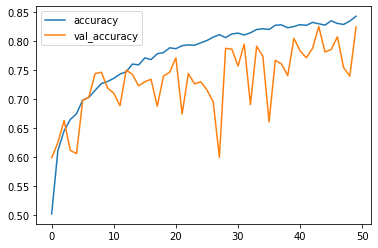

In [ ]:
plt.plot(history3.history['accuracy'],label='accuracy')
plt.plot(history3.history['val_accuracy'],label='val_accuracy')
plt.legend()

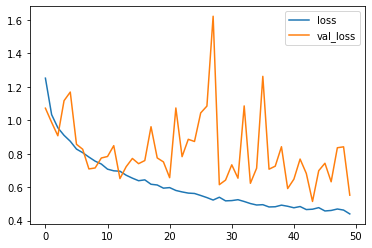

In [ ]:
plt.plot(history3.history['loss'],label='loss')
plt.plot(history3.history['val_loss'],label='val_loss')
plt.legend()

**Observation:**
*  model reached accuracy: 0.8429

## Get Predictions

In [ ]:
# load all images into a list
images3 = []
prediction3 = []

for img in os.listdir(test_folder):
  images3.append(img)
  img = os.path.join(test_folder, img)
  img = image.load_img(img, target_size=(150, 150,3))
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  
  pred = model3.predict(img)
  prediction3.append(np.argmax(pred))

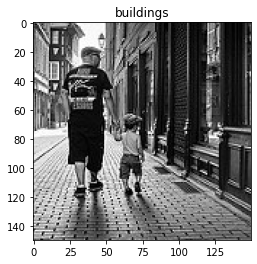

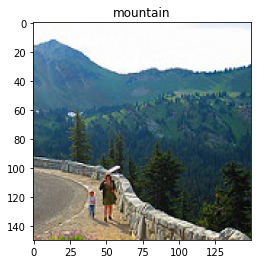

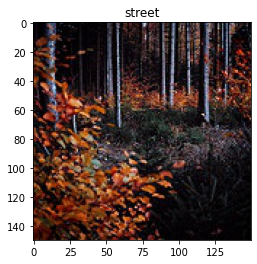

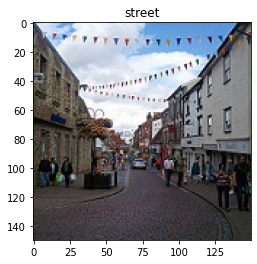

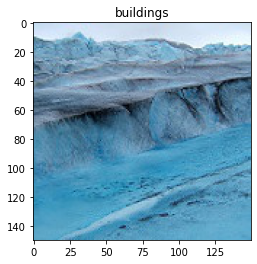

...

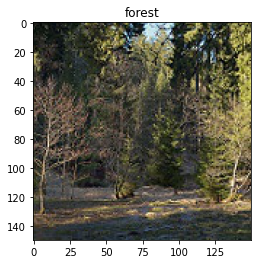

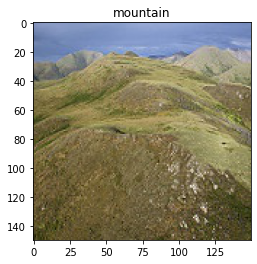

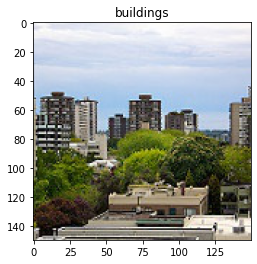

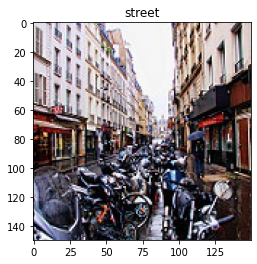

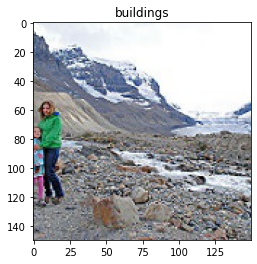

In [ ]:
# Show a sample of predicted images
for i in range(20):
  plt.title(categories_indecies_decode[prediction3[i]])
  image = mpimg.imread(test_folder+'/'+images3[i])
  plt.imshow(image)
  plt.show()

**

## Check pre trained images to make sure labels are correct
will check on forest images

In [ ]:
# import the modules
from keras.models import load_model
from keras.preprocessing import image

# load all images into a list
images_test = []
prediction_test = []

for img in os.listdir(path_folder_training+"/forest"):
  images_test.append(img)
  img = os.path.join(path_folder_training + "/forest", img)
  img = image.load_img(img, target_size=(150, 150,3))
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)

  pred = model3.predict(img)
  prediction_test.append(np.argmax(pred))

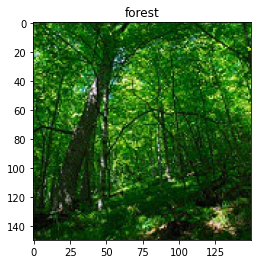

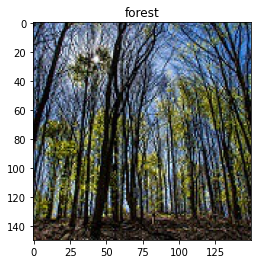

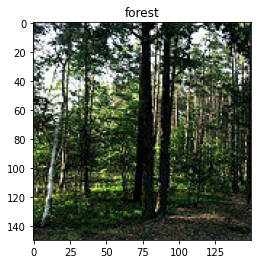

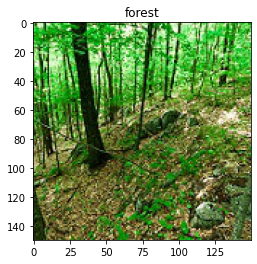

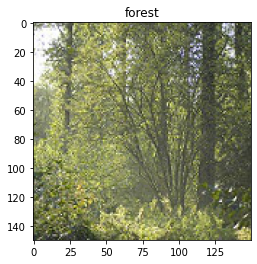

...

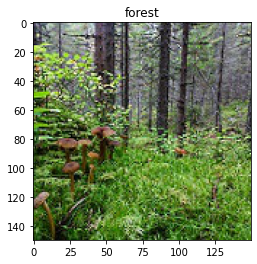

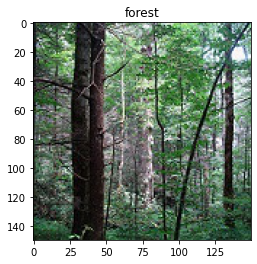

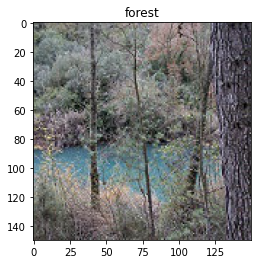

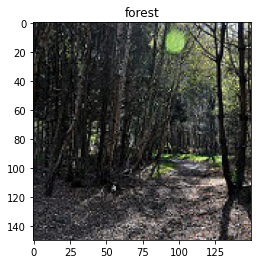

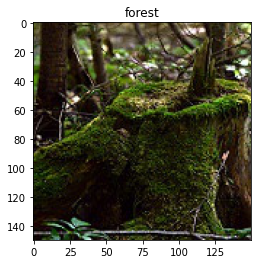

In [ ]:
# Show a sample of predicted images
for i in range(20):
  plt.title(categories_indecies_decode[prediction_test[i]])
  image = mpimg.imread(path_folder_training+"/forest"+'/'+images_test[i])
  plt.imshow(image)
  plt.show()

## Add Results to excel submit sheet

of second model



In [23]:
# Append Pandas DataFrame to Existing CSV File
# importing pandas module
import pandas as pd
 
# data of Player and their performance
data = {
    'Image': images,
    'Label': prediction2,
}
 
# Make data frame of above data 
df = pd.DataFrame(data)
 
# append data frame to CSV file
df.to_csv('submit.csv', mode='a', index=False, header=False)
 
# print message
print("Data appended successfully.")

Data appended successfully.
